Instalación de dependencias
 
***conda install seaborn***


Optional dependencies

    statsmodels, for advanced regression plots

    fastcluster, for clustering large matrices


Instalación statsmodels
 
https://anaconda.org/anaconda/statsmodels
 
**conda install -c anaconda statsmodels**
 
https://www.statsmodels.org/stable/install.html
 
**conda install -c conda-forge statsmodel**s

Instalación fastcluster
 
https://anaconda.org/conda-forge/fastcluster
  
To install this package with conda run one of the following:

*   **conda install -c conda-forge fastcluster**
*   conda install -c conda-forge/label/gcc7 fastcluster
* conda install -c conda-forge/label/cf201901 fastcluster
* conda install -c conda-forge/label/cf202003 fastcluster



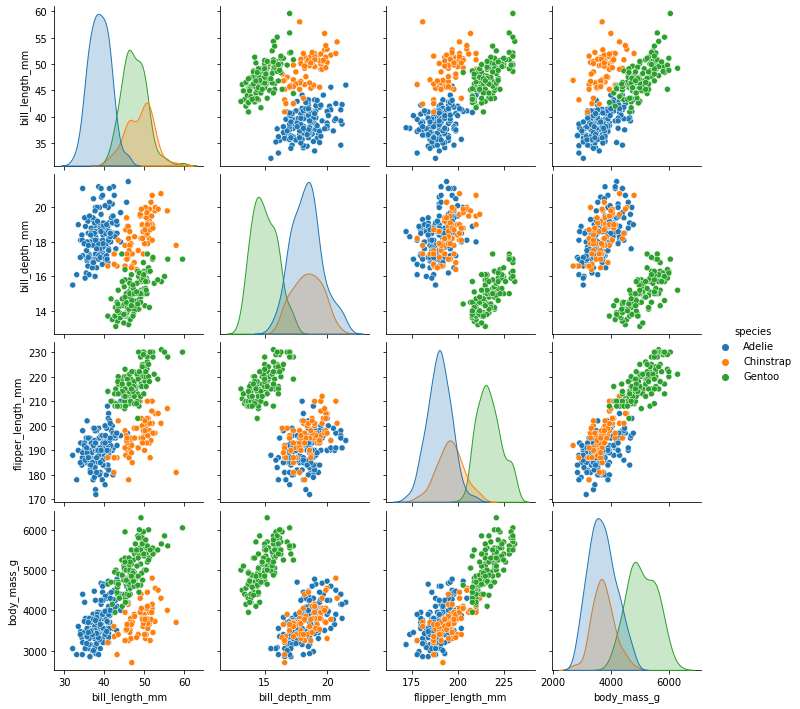

In [1]:
import seaborn as sns
df = sns.load_dataset("penguins")
sns.pairplot(df, hue="species")

Si no aparecen los gráficos o si se ejecuta en un entorno distinto de Jupyter, es posible que debais importa Matplot e invocar el método show(), tal como se indica a continuación:
 
import matplotlib.pyplot as plt
 
plt.show()

In [2]:
df.head()

,species,island,bill_length_mm,bill_depth_mm,flipper_length_mm,body_mass_g,sex
0,Adelie,Torgersen,39.1,18.7,181.0,3750.0,Male
1,Adelie,Torgersen,39.5,17.4,186.0,3800.0,Female
2,Adelie,Torgersen,40.3,18.0,195.0,3250.0,Female
3,Adelie,Torgersen,NaN,NaN,NaN,NaN,NaN
4,Adelie,Torgersen,36.7,19.3,193.0,3450.0,Female


In [3]:
df.index

RangeIndex(start=0, stop=344, step=1)

Con Numpy, Pandas y Matplot podemos usar sus funcionalidades

In [4]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

In [5]:
df = pd.DataFrame(C(6, 4), index=['fruta', 'verdura', 'lacteos', 'pasta', 'huevos', 'reposteria'],
                  columns=pd.Index(['Alfredo', 'Bruno', 'Carlos', 'Danel'], name='Compra'))
df

Compra,Alfredo,Bruno,Carlos,Danel
fruta,0.943479,0.886633,0.778921,0.274025
verdura,0.489268,0.647527,0.957507,0.982793
lacteos,0.392525,0.560675,0.444076,0.965817
pasta,0.352236,0.709290,0.519888,0.392363
huevos,0.580709,0.383946,0.153055,0.712636
reposteria,0.302328,0.792869,0.495868,0.291642


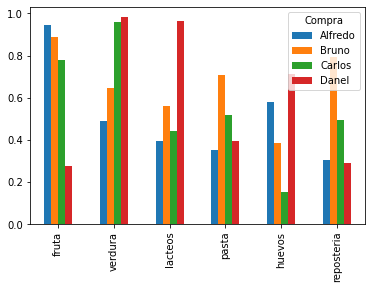

In [6]:
df.plot.bar(legend='best')

Representación con barras horizontales

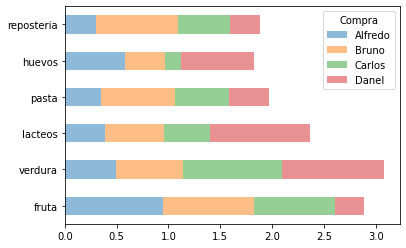

In [7]:
df.plot.barh(stacked=True, alpha=0.5) # El parámetro alpha es 0.5 por defecto

EJERCICIO
 
Repite el ejercicio anterior experimentando con los valores de alpha (entre 0 y 1).
 
¿Qué sucede?

Vamos a usar el de datos de ejemplo del propio Seaborn llamado "tips"
 
----------------------

In [8]:
tips = sns.load_dataset("tips")
tips.head()

,total_bill,tip,sex,smoker,day,time,size
0,16.99,1.01,Female,No,Sun,Dinner,2
1,10.34,1.66,Male,No,Sun,Dinner,3
2,21.01,3.50,Male,No,Sun,Dinner,3
3,23.68,3.31,Male,No,Sun,Dinner,2
4,24.59,3.61,Female,No,Sun,Dinner,4


Usaremos Pandas crosstab para reordenar la información. Ofrece una funcionalidad muy similar a la funcionalidad de groupby o pivot_table
 
"*The pandas crosstab function builds a cross-tabulation table that can show the frequency with which certain groups of data appear.*"
 
https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.crosstab.html
 
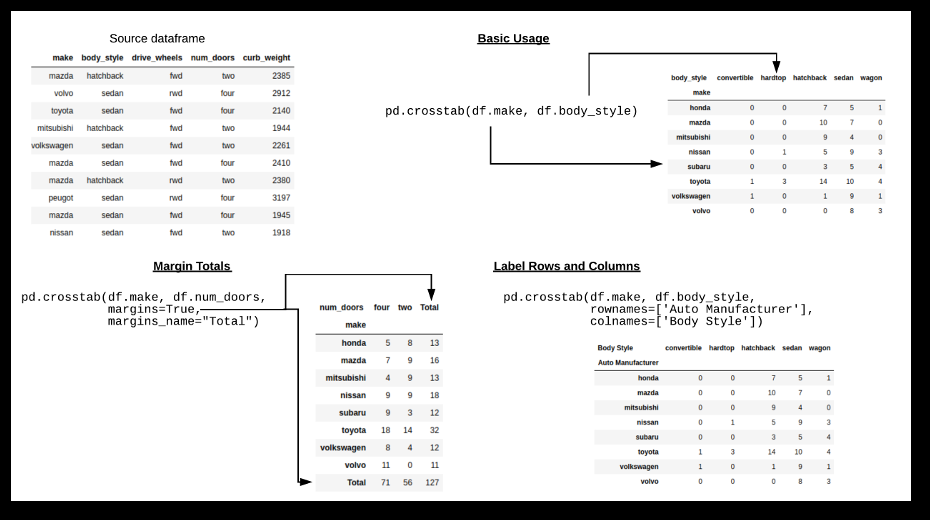

In [10]:
party_counts = pd.crosstab(tips['day'], tips['size'])
party_counts


size,1,2,3,4,5,6
day,,,,,,
Thur,1,48,4,5,1,3
Fri,1,16,1,1,0,0
Sat,2,53,18,13,1,0
Sun,0,39,15,18,3,1


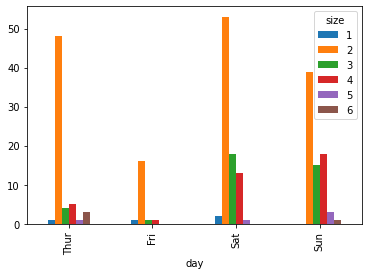

In [11]:
party_counts.plot.bar()


seaborn cambia automáticamente la estética de los gráficos. La paleta por defecto (color, fondo y color de lineas de la parrilla), puede ser modificada con la opción: sns.set(style="whitegrid")

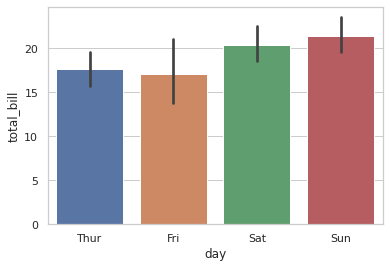

In [12]:
sns.set(style="whitegrid")
ax = sns.barplot(x="day", y="total_bill", data=tips)

In [13]:
tips['tip_pct'] = tips['tip'] / (tips['total_bill'] - tips['tip'])

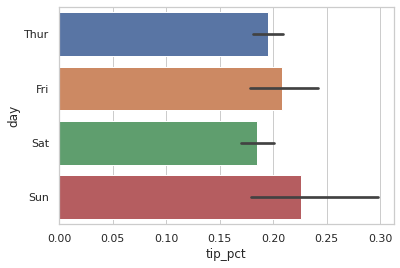

In [14]:
 sns.barplot(x='tip_pct', y='day', data=tips, orient='h')

La opción hue de seaborn.barplot permite de separar los datos mediante valores categóricos adicionales.
 
"*En estadística, una variable categórica es una variable que puede tomar uno de un número limitado, y por lo general fijo, de posibles valores, asignando a cada unidad individual u otro tipo observación a un grupo en particular o categoría nominal sobre la base de alguna característica cualitativa.​*"

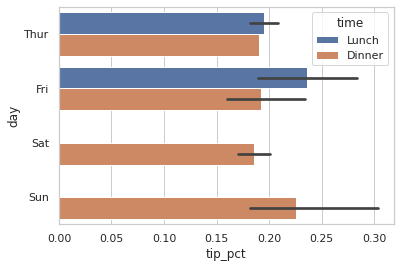

In [15]:
 sns.barplot(x='tip_pct', y='day', hue='time', data=tips, orient='h')

Las barras/lineas negras, representan el intervalo de confianza del 95%

Histogramas y gráficos densidad
 
-------------

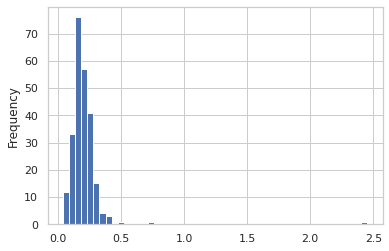

In [16]:
# Histogramas
tips['tip_pct'].plot.hist(bins=50)
# plt.figure(figsize=(10, 16)) ANCHO x ALTO

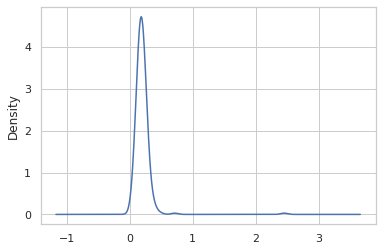

In [17]:
# Gráficos de densidad
tips['tip_pct'].plot.density()

Seaborn a través de su método displot permite representar histogramas con su función de densidad asociada de forma simultanea.


/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


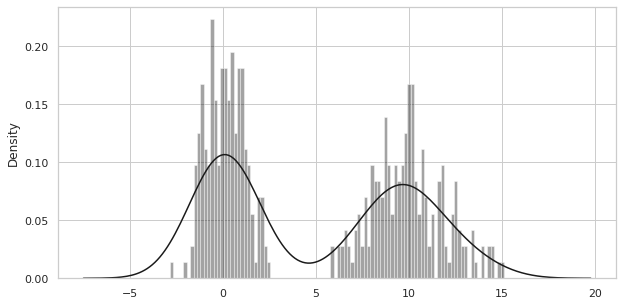

In [18]:
#  Distribución bimodal distribution con dos distribuciones estándar representadas a la vez
comp1 = np.random.normal(0, 1, size=200)
comp2 = np.random.normal(10, 2, size=200)
values = pd.Series(np.concatenate([comp1, comp2]))

plt.figure(figsize=(10, 5))

sns.distplot(values, bins=100, color='k')

Gráficos de dispersión o Scatter o Point Plots
 
------------------------

Este tipo de datos son muy útiles cuando queremos comparar datos de dos series de dato unidimensionales y ver si hay relación entre ellas.
 



In [20]:
# Cargamos el conjunto de datos de ejemplo llamado "macrodata"
url_macrodata = 'https://raw.githubusercontent.com/BrambleXu/pydata-notebook/master/examples/macrodata.csv'
macro = pd.read_csv(url_macrodata)

data = macro[['cpi', 'm1', 'tbilrate', 'unemp']]

trans_data = np.log(data).diff().dropna()
trans_data[-5:]


,cpi,m1,tbilrate,unemp
198,-0.007904,0.045361,-0.396881,0.105361
199,-0.021979,0.066753,-2.277267,0.139762
200,0.002340,0.010286,0.606136,0.160343
201,0.008419,0.037461,-0.200671,0.127339
202,0.008894,0.012202,-0.405465,0.042560


El método "regplot" de seaborn permite dibujar un gráfico de dispersión junto con su recta de regresión, (la recta de mejor ajuste de los datos dados).
 


/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


Text(0.5, 1.0, 'Changes in log m1 versus log unemp')

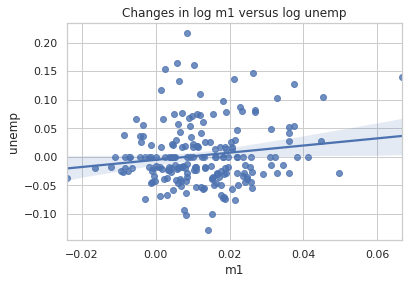

In [21]:
sns.regplot('m1', 'unemp', data=trans_data)
plt.title('Changes in log %s versus log %s' % ('m1', 'unemp'))

Cuando realizamos análisis de datos, con frecuencia es interesante poder ver todos gráficos de dispersión juntos, dado un grupo de variables. Esto se conoce como "pairs plot o scatter plot matrix". 
 
Seaborn implementa el método pairplot para facilitar este trabajo.
 


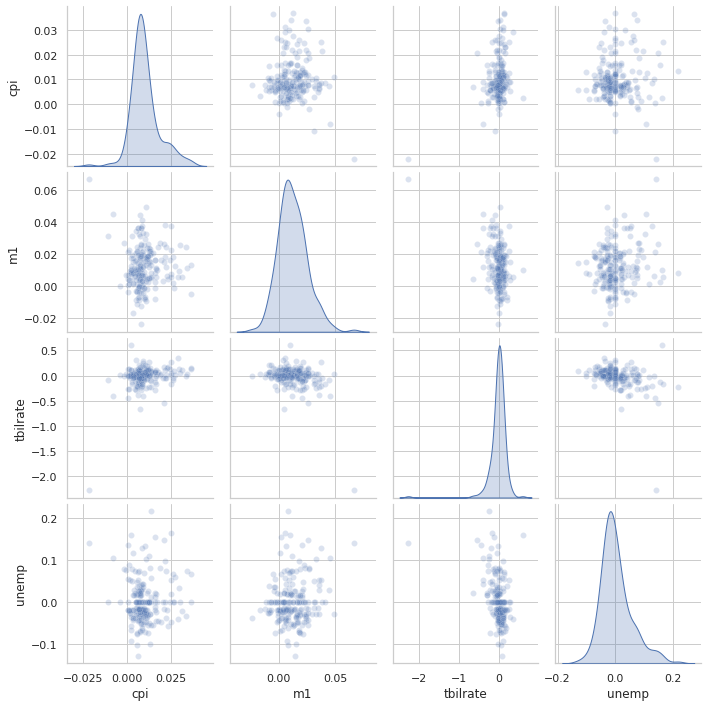

In [22]:
 sns.pairplot(trans_data, diag_kind='kde', plot_kws={'alpha': 0.2})

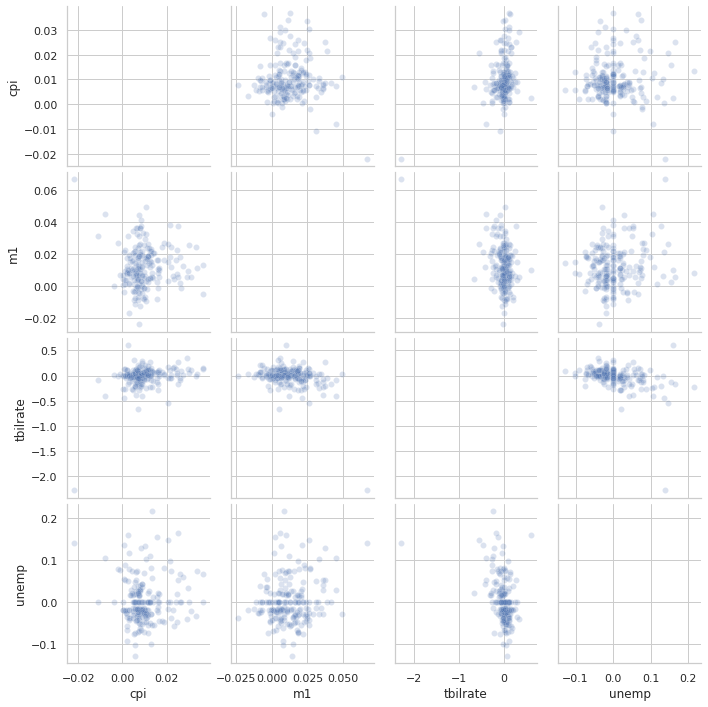

In [24]:
 sns.pairplot(trans_data, diag_kind='reg', plot_kws={'alpha': 0.2})

plot_kws permte variar los parámetros
 
https://seaborn.pydata.org/generated/seaborn.pairplot.html
 

EJERCICIO
 
Repetir el gráfico anterior variando los parámetros de plot_kws ( plot_kws={'alpha': 0.?} )

----------------------

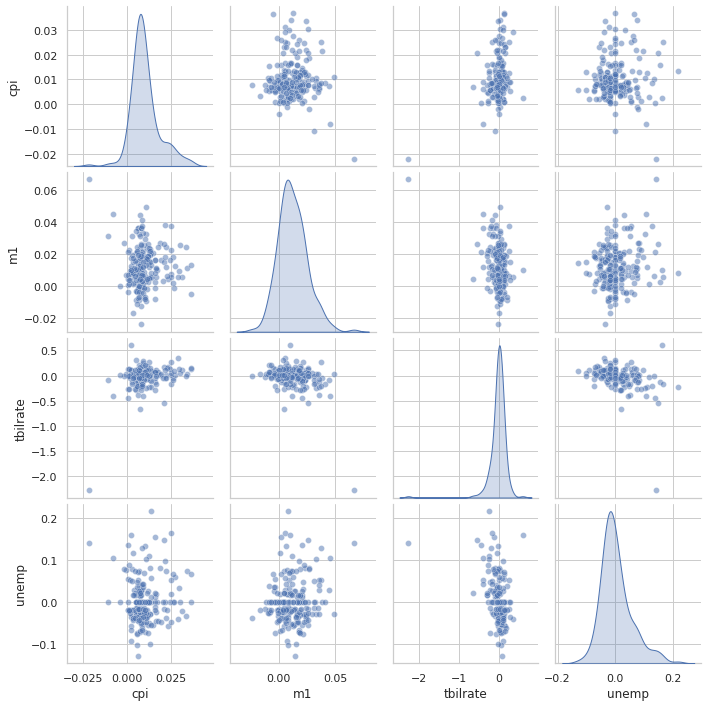

In [25]:
sns.pairplot(trans_data, diag_kind='kde', plot_kws={'alpha': 0.5})

----------------------

EJEMPLO con datos de cancer de pecho
 
------------------------

In [26]:
from sklearn.datasets import load_breast_cancer

cancer_dataset = load_breast_cancer()
# create datafrmae
cancer_df = pd.DataFrame(np.c_[cancer_dataset['data'],cancer_dataset['target']],
             columns = np.append(cancer_dataset['feature_names'], ['target']))
cancer_df.head(6)

,mean radius,mean texture,mean perimeter,mean area,mean smoothness,mean compactness,mean concavity,mean concave points,mean symmetry,mean fractal dimension,radius error,texture error,perimeter error,area error,smoothness error,compactness error,concavity error,concave points error,symmetry error,fractal dimension error,worst radius,worst texture,worst perimeter,worst area,worst smoothness,worst compactness,worst concavity,worst concave points,worst symmetry,worst fractal dimension,target
0,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,0.2419,0.07871,1.0950,0.9053,8.589,153.40,0.006399,0.04904,0.05373,0.01587,0.03003,0.006193,25.38,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890,0.0
1,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812,0.05667,0.5435,0.7339,3.398,74.08,0.005225,0.01308,0.01860,0.01340,0.01389,0.003532,24.99,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902,0.0
2,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,0.2069,0.05999,0.7456,0.7869,4.585,94.03,0.006150,0.04006,0.03832,0.02058,0.02250,0.004571,23.57,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758,0.0
3,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,0.2597,0.09744,0.4956,1.1560,3.445,27.23,0.009110,0.07458,0.05661,0.01867,0.05963,0.009208,14.91,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300,0.0
4,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,0.1809,0.05883,0.7572,0.7813,5.438,94.44,0.011490,0.02461,0.05688,0.01885,0.01756,0.005115,22.54,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678,0.0
5,12.45,15.70,82.57,477.1,0.12780,0.17000,0.1578,0.08089,0.2087,0.07613,0.3345,0.8902,2.217,27.19,0.007510,0.03345,0.03672,0.01137,0.02165,0.005082,15.47,23.75,103.40,741.6,0.1791,0.5249,0.5355,0.1741,0.3985,0.12440,0.0


In [27]:
cancer_df.index

RangeIndex(start=0, stop=569, step=1)

data: data parameter is the required parameter to pass data to plot pairplot

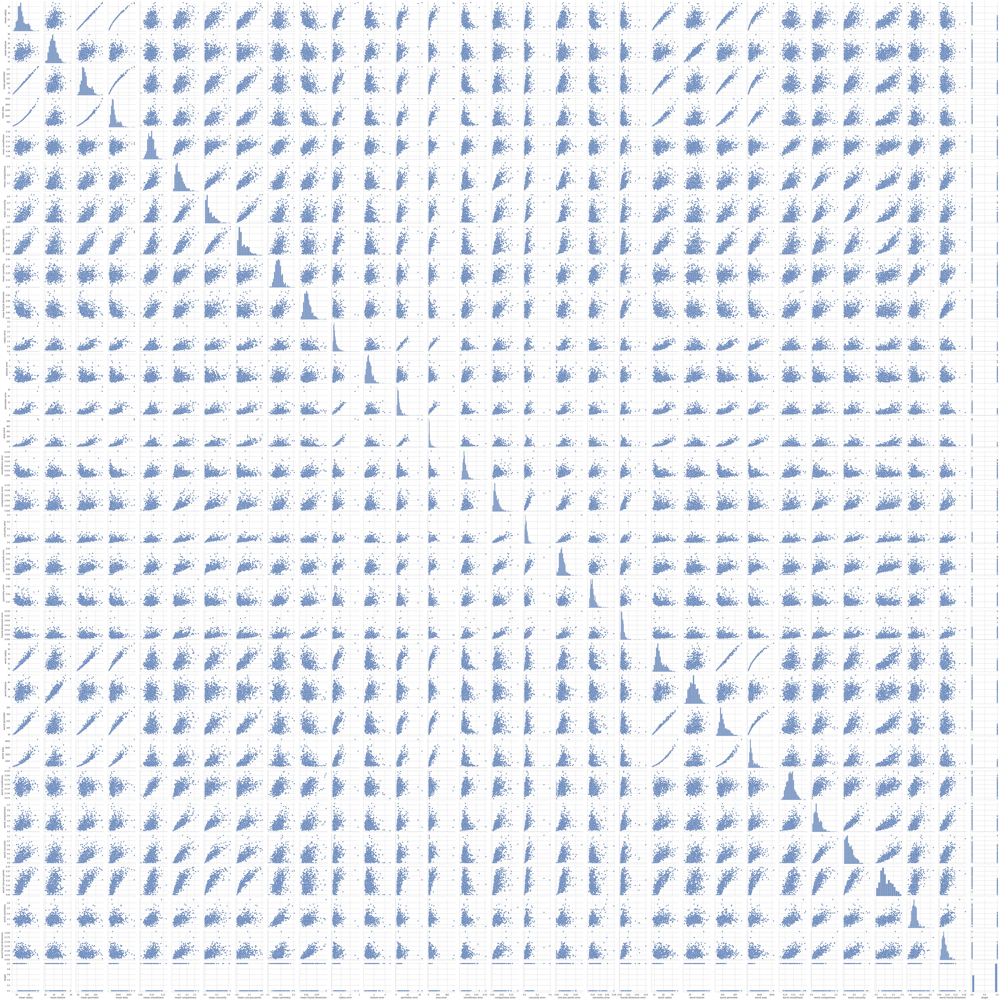

In [ ]:
#plot seaborn pairplot
# CUIDADO puede tardar mucho tiempo en ejecutar
sns.pairplot(cancer_df)

vars: It hep to plot pairplot accounting to required features/variable. Pass list of variable names, optional
 
------------------------

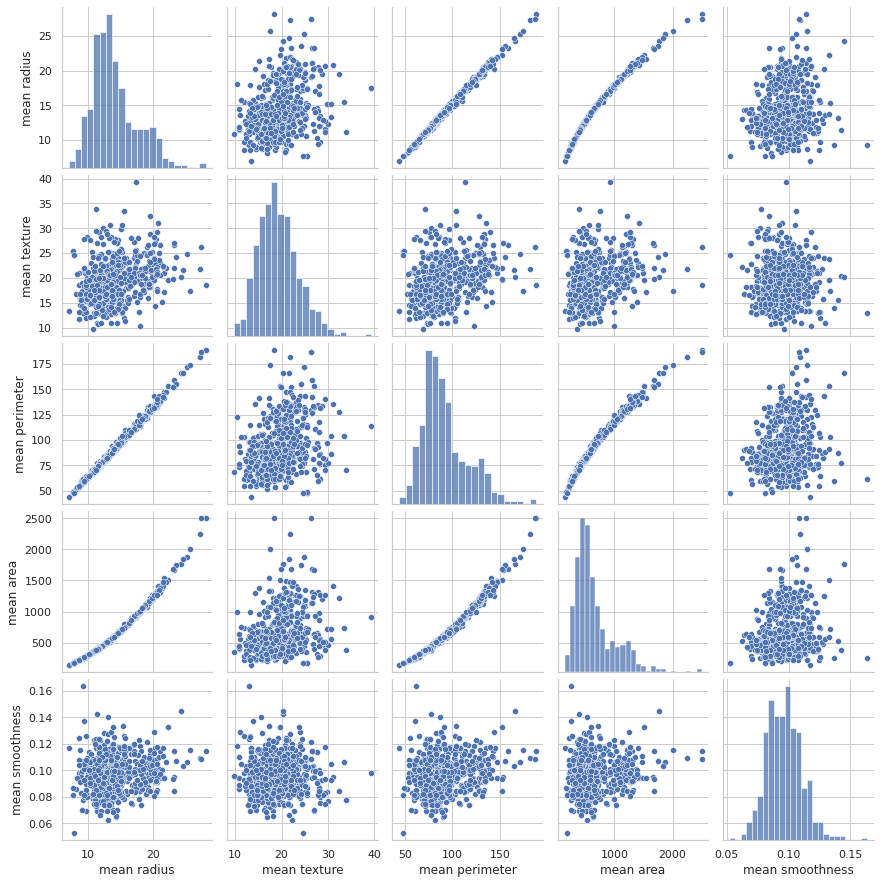

In [ ]:
sns.pairplot(cancer_df, vars = ['mean radius', 'mean texture', 'mean perimeter', 'mean area',
        'mean smoothness'])

hue: Map the third feature to get more insights. Pass string (variable name), optional
 
--------------------------

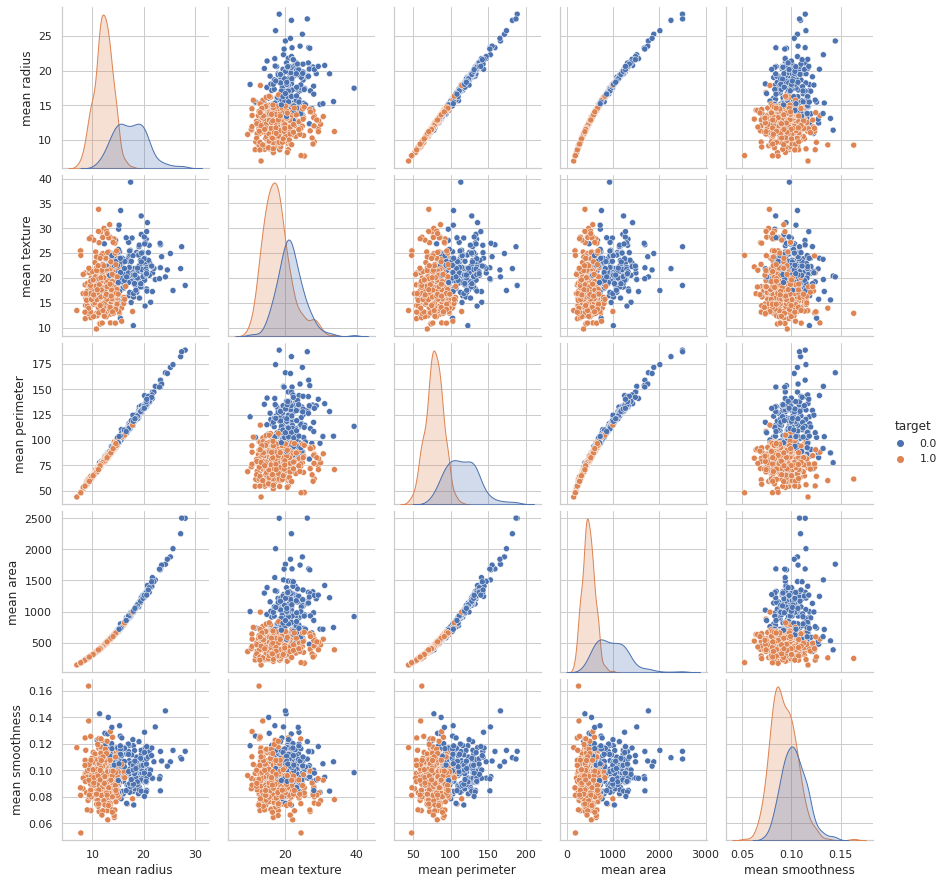

In [ ]:
sns.pairplot(cancer_df, vars = ['mean radius', 'mean texture', 'mean perimeter', 'mean area',
        'mean smoothness'], hue ='target')

Podéis cambiar la paleta de colores mediante: sns.color_palette("tab10")
 
https://seaborn.pydata.org/tutorial/color_palettes.html

Código de los ejemplos anteriores
 
https://indianaiproduction.com/seaborn-pairplot/

----------------------------------

Facet Grids and Categorical Data
 
---------------------------------
 
En los conjuntos de datos con varias dimensiones susceptibles de ser visualizadas, una forma de visualizar datos con varias variables categóricas es usar un gráfico tipo "facet grid".
 
Seaborn dispone del método factorplot para facilitar este trabajo

/usr/local/lib/python3.6/dist-packages/seaborn/categorical.py:3704: UserWarning: The `factorplot` function has been renamed to `catplot`. The original name will be removed in a future release. Please update your code. Note that the default `kind` in `factorplot` (`'point'`) has changed `'strip'` in `catplot`.
  warnings.warn(msg)


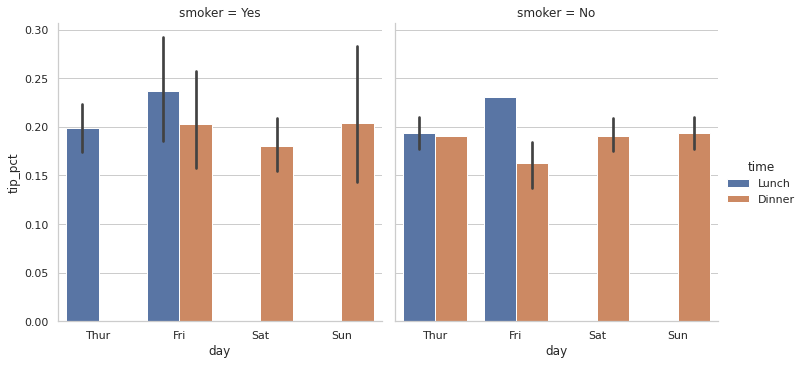

In [ ]:
 sns.factorplot(x='day', y='tip_pct', hue='time', col='smoker', kind='bar', data=tips[tips.tip_pct < 1])


/usr/local/lib/python3.6/dist-packages/seaborn/categorical.py:3704: UserWarning: The `factorplot` function has been renamed to `catplot`. The original name will be removed in a future release. Please update your code. Note that the default `kind` in `factorplot` (`'point'`) has changed `'strip'` in `catplot`.
  warnings.warn(msg)


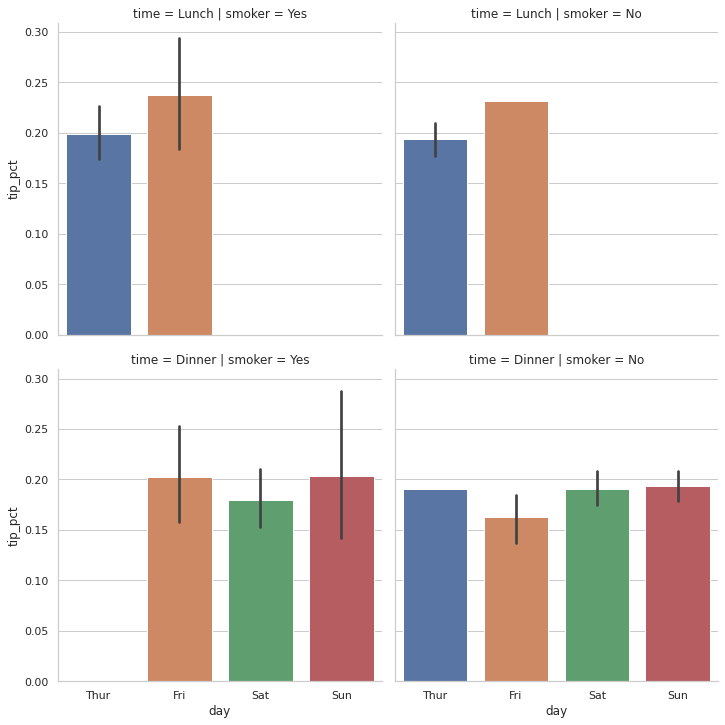

In [ ]:
 sns.factorplot(x='day', y='tip_pct', row='time', col='smoker', kind='bar', data=tips[tips.tip_pct < 1])

Box plots para mostrar mediana, cuartiles y valores atípicos o outliers
 
-----------------------

/usr/local/lib/python3.6/dist-packages/seaborn/categorical.py:3704: UserWarning: The `factorplot` function has been renamed to `catplot`. The original name will be removed in a future release. Please update your code. Note that the default `kind` in `factorplot` (`'point'`) has changed `'strip'` in `catplot`.
  warnings.warn(msg)


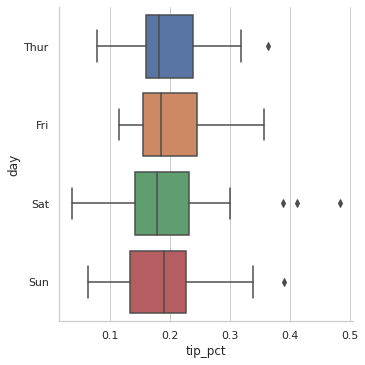

In [ ]:
sns.factorplot(x='tip_pct', y='day', kind='box', data=tips[tips.tip_pct < 0.5])


TRABAJANDO CON DATOS REALES
 
---------------------------------

In [ ]:
# Utilizo la columna 'code' como índice
datos = pd.read_csv ('/content/drive/My Drive/2011_us_ag_exports.csv', index_col = 0)

In [ ]:
datos.head()

,state,region,total exports,beef,pork,poultry,dairy,fruits fresh,fruits proc,total fruits,veggies fresh,veggies proc,total veggies,corn,wheat,cotton
code,,,,,,,,,,,,,,,,
AL,Alabama,Southeast,1390.63,34.4,10.6,481.0,4.06,8.0,17.1,25.11,5.5,8.9,14.33,34.9,70.0,317.61
AK,Alaska,Far West,13.31,0.2,0.1,0.0,0.19,0.0,0.0,0.00,0.6,1.0,1.56,0.0,0.0,0.00
AZ,Arizona,Southwest,1463.17,71.3,17.9,0.0,105.48,19.3,41.0,60.27,147.5,239.4,386.91,7.3,48.7,423.95
AR,Arkansas,Southeast,3586.02,53.2,29.4,562.9,3.53,2.2,4.7,6.88,4.4,7.1,11.45,69.5,114.5,665.44
CA,California,Far West,16472.88,228.7,11.1,225.4,929.95,2791.8,5944.6,8736.40,803.2,1303.5,2106.79,34.6,249.3,1064.95


In [ ]:
df = pd.DataFrame(datos)

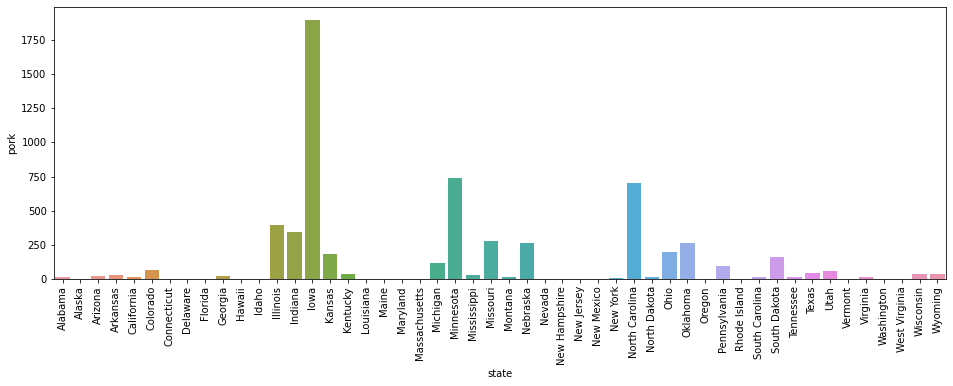

In [ ]:
plt.figure(figsize=(16, 5))
plt.xticks(rotation='vertical')
sns.barplot(x="state", y="pork", data=datos)

Usando barras horizontales.
 
El uso de barras horizontales requiere de datos númericos en el eje x
* x e y han de ser columnas del juego de datos que queremos mostrar
* x = columna con los datos que apareceran en el eje x
* y = columna con los datos que apareceran en el eje y

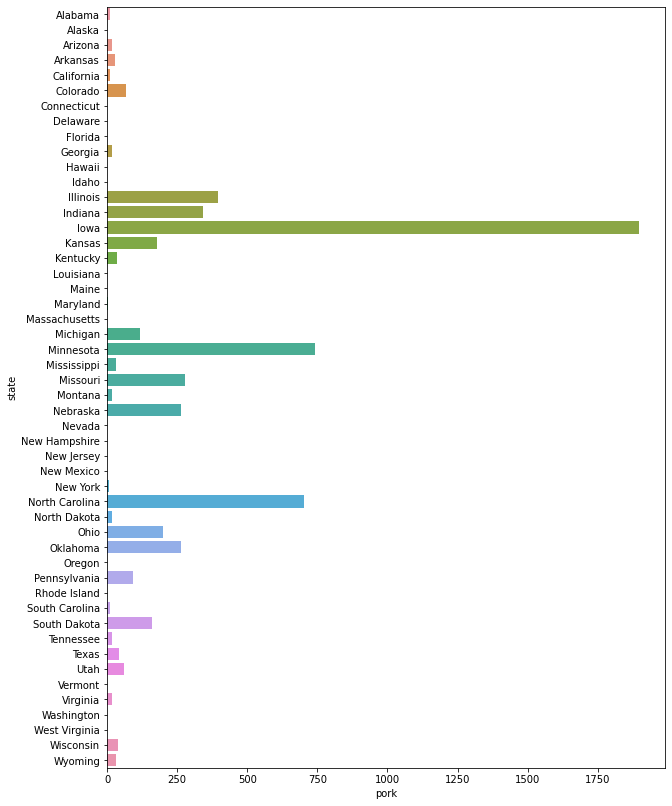

In [ ]:
# Definimos el tamaño de la figura insitu
plt.figure(figsize=(10, 16))
# x e y han de ser columnas del juego de datos que queremos mostrar
# x = columna con los datos que apareceran en el eje x
# y = columna con los datos que apareceran en el eje y
sns.barplot(x='pork', y='state', data=datos, orient='h')

Mostrar los datos anteriores pero esta vez con datos porcentuales

In [ ]:
# datos_porcentuales = df['pork']/df['pork'].sum(axis=1)
total = df['pork'].sum()
df['porcentaje'] = (df['pork']/total) * 100
#plt.figure(figsize=(10, 16))
#sns.barplot(x='pork', y='state', data=datos, orient='h')

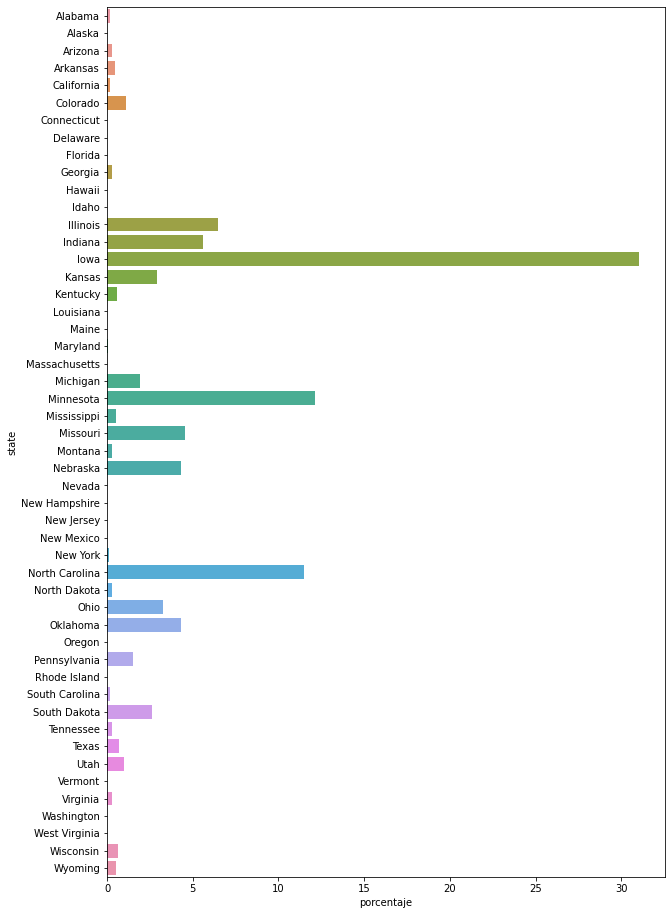

In [ ]:
plt.figure(figsize=(10, 16))
sns.barplot(x='porcentaje', y='state', data=datos, orient='h')